In [100]:
import pandas as pd
# Import plotly
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio


from datetime import datetime

# setting Jedha color palette as default
pio.templates["jedha"] = go.layout.Template(
    layout_colorway=["#4B9AC7", "#4BE8E0", "#9DD4F3", "#97FBF6", "#2A7FAF", "#23B1AB", "#0E3449", "#015955"]
)
pio.templates.default = "jedha"
pio.renderers.default = "svg" # to be replaced by "iframe" if working on JULIE
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
import numpy as np
from sklearn.metrics import  silhouette_score

# 1.  Import and loading of the dataset with labels and creation of a DataFrame

In [101]:
df = pd.read_csv('/Users/agustindei/Documents/Jedha/Full_Stack/Projets/Uber/uber-raw-data-apr14.csv')
df.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


# 2. EDA

In [102]:
display(df.info())
print("dataframe'shape:", df.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 564516 entries, 0 to 564515
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   Date/Time  564516 non-null  object 
 1   Lat        564516 non-null  float64
 2   Lon        564516 non-null  float64
 3   Base       564516 non-null  object 
dtypes: float64(2), object(2)
memory usage: 17.2+ MB


None

dataframe'shape: (564516, 4)


In [103]:
df['Base'].value_counts()

Base
B02682    227808
B02598    183263
B02617    108001
B02512     35536
B02764      9908
Name: count, dtype: int64

In [104]:
df.describe(include='all')

,Date/Time,Lat,Lon,Base
count,564516,564516.000000,564516.000000,564516
unique,41999,NaN,NaN,5
top,4/7/2014 20:21:00,NaN,NaN,B02682
freq,97,NaN,NaN,227808
mean,NaN,40.740005,-73.976817,NaN
std,NaN,0.036083,0.050426,NaN
min,NaN,40.072900,-74.773300,NaN
25%,NaN,40.722500,-73.997700,NaN
50%,NaN,40.742500,-73.984800,NaN
75%,NaN,40.760700,-73.970000,NaN


In [105]:
#Checking missing values per column
print("Missing values: ")
print(df.isnull().any())
print()
print("Percentage of missing values: ")
display(100 * df.isnull().sum() / df.shape[0])

print(df.shape)

Missing values: 
Date/Time    False
Lat          False
Lon          False
Base         False
dtype: bool

Percentage of missing values: 


Date/Time    0.0
Lat          0.0
Lon          0.0
Base         0.0
dtype: float64

(564516, 4)


In [106]:
df.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


On convertit la colonne date à datetime pour extraire les informations et créer ainsi les colonnes : "day", "month", "year", "hour"

In [107]:
df['Date/Time'] = pd.to_datetime(df['Date/Time'])

df["Day"] = df['Date/Time'].dt.weekday
df["Month"] = df['Date/Time'].dt.month
df["Year"] = df['Date/Time'].dt.year
df["Hour"] = df['Date/Time'].dt.hour
print(df.head())
print(df.dtypes)

#Return the day of the week as an integer, where Monday is 0 and Sunday is 6. For example, date(2002, 12, 4).weekday() == 2, a Wednesday. 


            Date/Time      Lat      Lon    Base  Day  Month  Year  Hour
0 2014-04-01 00:11:00  40.7690 -73.9549  B02512    1      4  2014     0
1 2014-04-01 00:17:00  40.7267 -74.0345  B02512    1      4  2014     0
2 2014-04-01 00:21:00  40.7316 -73.9873  B02512    1      4  2014     0
3 2014-04-01 00:28:00  40.7588 -73.9776  B02512    1      4  2014     0
4 2014-04-01 00:33:00  40.7594 -73.9722  B02512    1      4  2014     0
Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
Day                   int32
Month                 int32
Year                  int32
Hour                  int32
dtype: object


In [108]:
day_mapping = {6: 'Sunday', 0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday'}
df['Day'] = df['Day'].map(day_mapping)
df.head()

,Date/Time,Lat,Lon,Base,Day,Month,Year,Hour
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,Tuesday,4,2014,0
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,Tuesday,4,2014,0
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,Tuesday,4,2014,0
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,Tuesday,4,2014,0
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,Tuesday,4,2014,0


In [109]:
print('distinct days: {}'.format(df['Day'].value_counts().count()))
print('distinct months: {}'.format(df['Month'].value_counts().count()))
print('distinct years: {}'.format(df['Year'].value_counts().count()))
print('distinct hours: {}'.format(df['Hour'].value_counts().count()))

distinct days: 7
distinct months: 1
distinct years: 1
distinct hours: 24


### Visualisations

Carte de tous les pickup points.

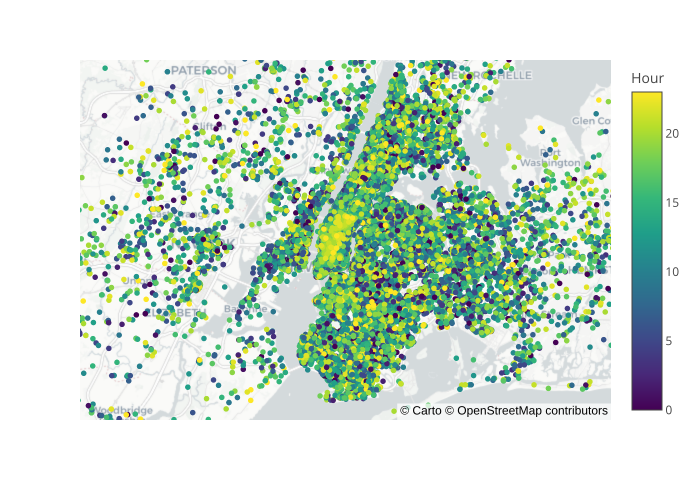

In [110]:
fig = px.scatter_mapbox(df, lat="Lat", lon="Lon", color="Hour",
                        zoom=9, mapbox_style="carto-positron")
fig.show()

Nombre de pickups par heure sur le total

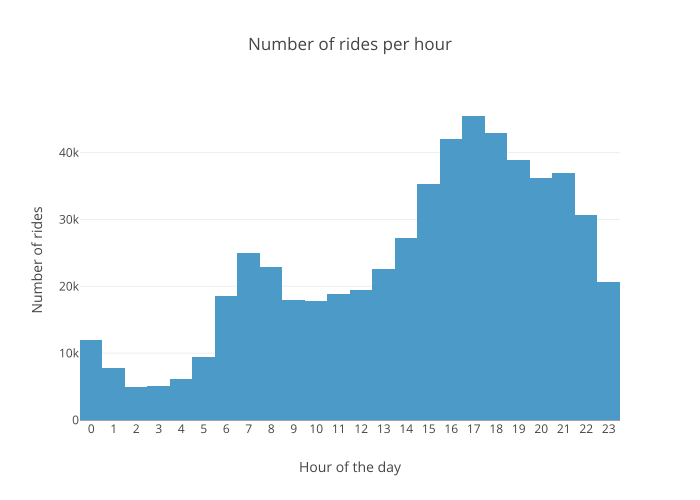

In [111]:
fig = px.histogram(df, x='Hour', nbins=24, title='Number of rides per hour')

fig.update_layout(xaxis_title='Hour of the day', yaxis_title='Number of rides', xaxis=dict(
        tickmode='linear'))

fig.show()

In [112]:
#On vérifie avec value_counts()
df.Hour.value_counts()

Hour
17    45475
18    43003
16    42003
19    38923
21    36964
20    36244
15    35324
22    30645
14    27190
7     24924
8     22843
13    22603
23    20649
12    19425
11    18774
6     18498
9     17939
10    17865
0     11910
5      9476
1      7769
4      6095
3      5040
2      4935
Name: count, dtype: int64

Nombre de pickups par jour

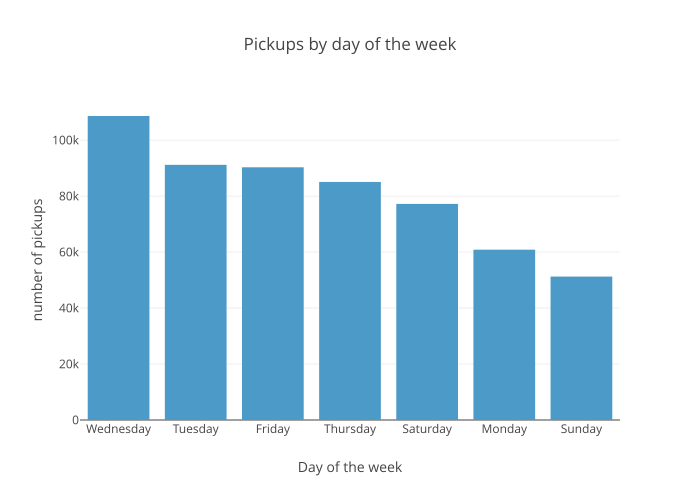

In [113]:

day_counts = df.Day.value_counts()

fig = px.bar(df, 
            x=day_counts.index,
            y= day_counts.values,
            labels={'x': 'Day of the week', 'y':'number of pickups'},      
            title='Pickups by day of the week', 
                   )


fig.show()

La plupart des pickups ont lieu le mercredi. 

En semaine, le lundi est le jour où la demande de courses uber est la plus faible.

Nous créons un nouveau DF pour la journée avec plus de pickups et nous examinons la distribution géographique et l'heure.

In [114]:
df_wednesday = df[df['Day'] == 'Wednesday']
df_wednesday.shape

(108631, 8)

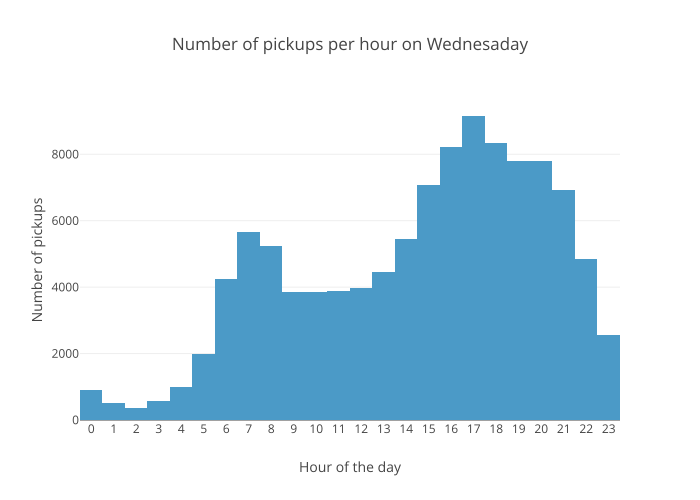

In [115]:
fig = px.histogram(df_wednesday, x='Hour', nbins=24, title='Number of pickups per hour on Wednesaday')
fig.update_layout(xaxis_title='Hour of the day', yaxis_title='Number of pickups', xaxis=dict(
        tickmode='linear'))

fig.show()

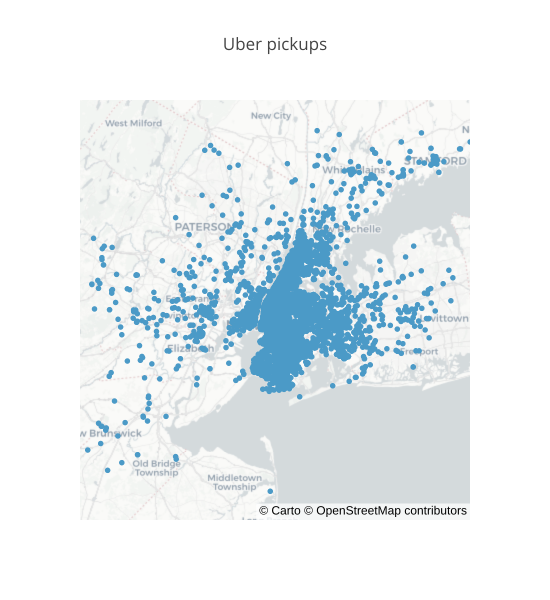

In [116]:
fig = px.scatter_mapbox(df_wednesday, lat="Lat", lon="Lon", 
                        zoom=8, mapbox_style="carto-positron", title='Uber pickups')

fig.update_layout(width=550, height=600)
fig.show()


On regarde quelle est la situation le jour où la demande est la plus faible, le dimanche.

In [117]:
df_sunday = df[df['Day'] == 'Sunday']
df_sunday.shape

(51251, 8)

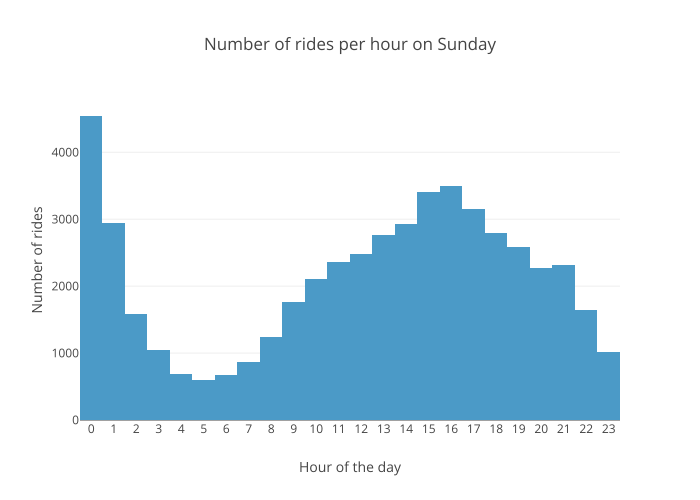

In [118]:
fig = px.histogram(df_sunday, x='Hour', nbins=24, title='Number of rides per hour on Sunday')
fig.update_layout(xaxis_title='Hour of the day', yaxis_title='Number of rides', xaxis=dict(
        tickmode='linear'))

fig.show()

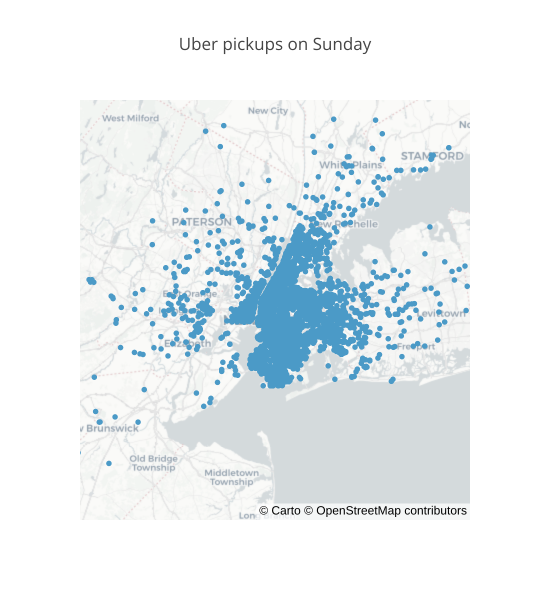

In [119]:
fig = px.scatter_mapbox(df_sunday, lat="Lat", lon="Lon", 
                        zoom=8, mapbox_style="carto-positron", title='Uber pickups on Sunday')

fig.update_layout(width=550, height=600)
fig.show()


La distribution géographique des pickups le dimanche est similaire à celle de mercredi.

En revanche, la distribution par heure varie : le dimanche il y a une grande demande à minuit.

# 3. Data preprocessing

-On drop colonnes "year" et "month", car toutes les lignes renvoient à la même année et au même mois. 

-On crée un nouveau df, df_sample.

In [120]:
df_sample = df.drop(['Date/Time','Year', 'Base', 'Month'], axis = 1)
df_sample.head()

,Lat,Lon,Day,Hour
0,40.7690,-73.9549,Tuesday,0
1,40.7267,-74.0345,Tuesday,0
2,40.7316,-73.9873,Tuesday,0
3,40.7588,-73.9776,Tuesday,0
4,40.7594,-73.9722,Tuesday,0


Taille du dataset:

In [121]:
print(f'Nombre de lignes du dataset :',df_sample.shape[0])

Nombre de lignes du dataset : 564516


On fera une comparaison entre deux créneaux le jour où la demande est la plus élévée, le mercredi :

-Le matin à 10h.

-Les heures de pointe (17h-18h).

On fait donc un masque pour créer deux nouvelles versions de notre df, df_sample.

On commence par filtrer les heures de pointe.

In [122]:
filter_hour = [17, 18]

df_heure_pointe = df_sample[df_sample['Hour'].isin(filter_hour)]

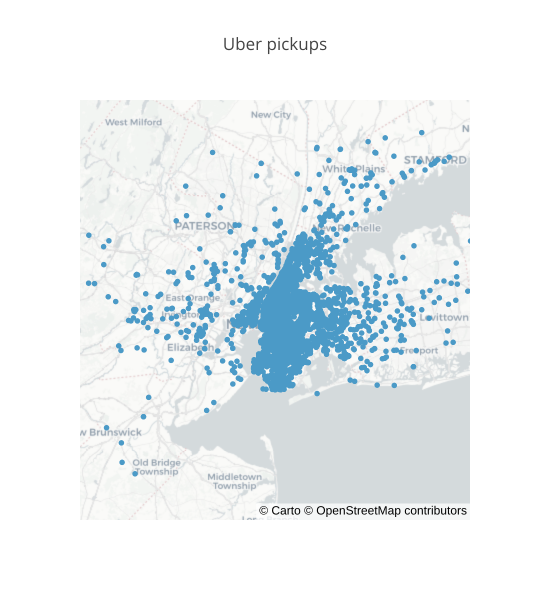

In [123]:
fig = px.scatter_mapbox(df_heure_pointe, lat="Lat", lon="Lon", 
                        zoom=8, mapbox_style="carto-positron", title='Uber pickups')

fig.update_layout(width=550, height=600)
fig.show()

On filtre par les heures de pointes et le mercredi.

In [124]:
filter_day = ['Wednesday']
filter_hour = [17,18]

df_rush_hour_wednesday = df_sample[df_sample['Hour'].isin(filter_hour) & df_sample['Day'].isin(filter_day)]

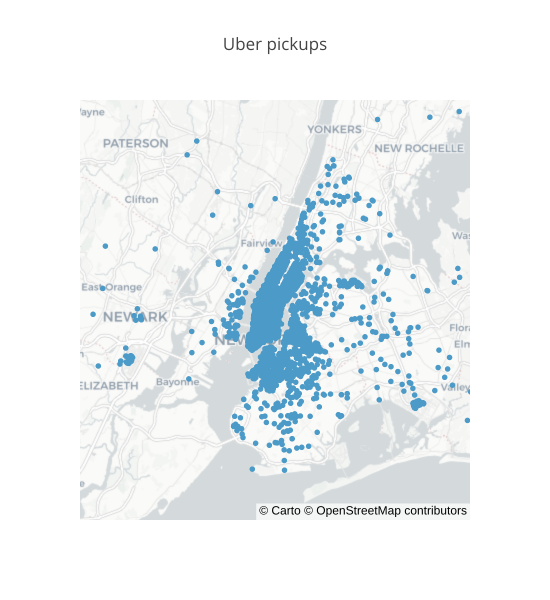

In [125]:
fig = px.scatter_mapbox(df_rush_hour_wednesday, lat="Lat", lon="Lon", 
                        zoom=9, mapbox_style="carto-positron", title='Uber pickups')

fig.update_layout(width=550, height=600)
fig.show()

On voit que les mercredi aux heures de pointe les courses semblent se concentrer sur 2 zones géographiques.

Maintenant on cherche les données de mercredi à 10h.

In [126]:
filter_day = ['Wednesday']
filter_hour = [10]

df_wednesday_morning = df_sample[df_sample['Hour'].isin(filter_hour) & df_sample['Day'].isin(filter_day)]

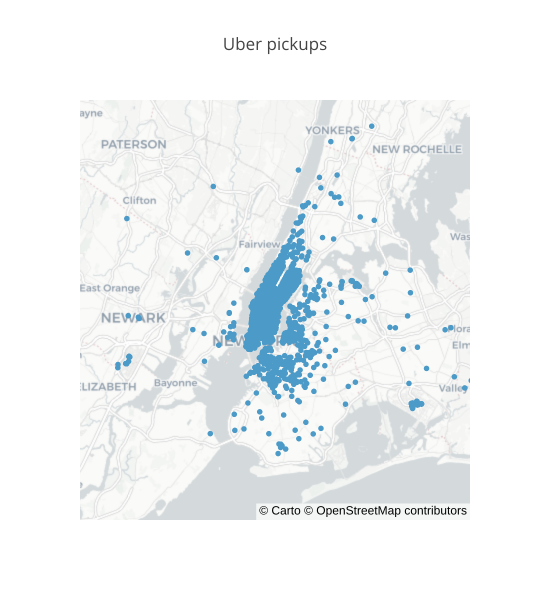

In [127]:
fig = px.scatter_mapbox(df_wednesday_morning, lat="Lat", lon="Lon", 
                        zoom=9, mapbox_style="carto-positron", title='Uber pickups')

fig.update_layout(width=550, height=600)
fig.show()

La distribution géographique des pickups varie légèrement par rapport à celles des heures de pointe, mais il y a zone qui reste toujours très demandée.

# Entraînement du modèle

On cherchera des clusters pour les deux créneaux du mercredi : le matin à 10h ainsi qu'à l'heure de pointe à 17h et à 18h.

In [128]:
df_wednesday_morning

,Lat,Lon,Day,Hour
1325,40.7595,-73.9854,Wednesday,10
1326,40.7258,-73.9949,Wednesday,10
1327,40.7539,-73.9954,Wednesday,10
1328,40.7720,-73.9610,Wednesday,10
1329,40.7749,-73.9652,Wednesday,10
...,...,...,...,...
564028,40.7665,-73.9514,Wednesday,10
564029,40.7266,-73.9076,Wednesday,10
564030,40.7365,-73.9816,Wednesday,10
564031,40.7710,-73.8659,Wednesday,10


In [129]:
X = df_wednesday_morning.drop(['Day','Hour'], axis = 1)


In [130]:
sc = StandardScaler()

print("Performing preprocessing...")
print(X.head())
print()
X = sc.fit_transform(X)
print('...Done.')
print(X[0:5]) 
print()


Performing preprocessing...
          Lat      Lon
1325  40.7595 -73.9854
1326  40.7258 -73.9949
1327  40.7539 -73.9954
1328  40.7720 -73.9610
1329  40.7749 -73.9652

...Done.
[[ 0.4616471  -0.14716646]
 [-0.52676131 -0.33280014]
 [ 0.29740119 -0.34257034]
 [ 0.82826742  0.32961899]
 [ 0.91332334  0.24754936]]



## DBSCAN

### Analyse du créneau de mercredi matin à 10h

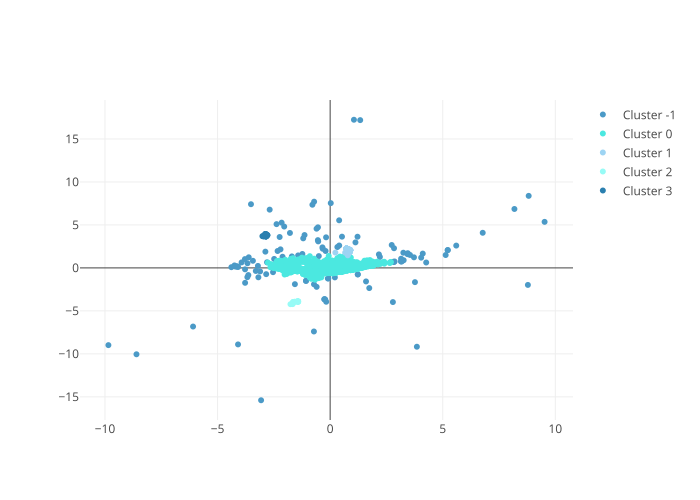

In [131]:
db_manhattan_morning = DBSCAN(eps=0.5, min_samples=16, metric="manhattan", algorithm="auto")

db_manhattan_morning.fit(X)

# Visualize with plotly

## Import go to build our own figure
import plotly.graph_objects as go

fig = go.Figure()

# Loop through each label for our cluster
for i in np.unique(db_manhattan_morning.labels_):
    label = X[db_manhattan_morning.labels_ == i]
    fig.add_trace(go.Scatter(x=label[:, 0], y=label[:, 1], mode="markers", name="Cluster {}".format(i)))

fig.show()

In [133]:
df_wednesday_morning.loc[:,"cluster_manhattan"] = db_manhattan_morning.labels_

/var/folders/sp/y1prs_xd6c5dq9mttys340t40000gn/T/ipykernel_21805/3992847664.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [134]:
df_wednesday_morning["cluster_manhattan"].value_counts()

cluster_manhattan
 0    3589
-1     113
 1      94
 3      30
 2      18
Name: count, dtype: int64

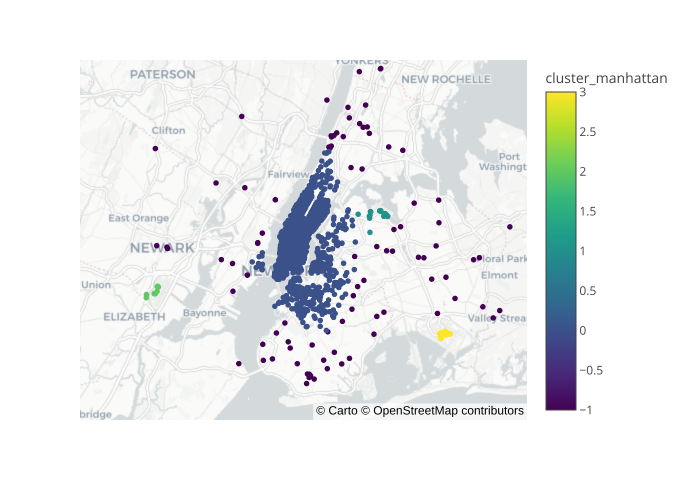

In [135]:
fig = px.scatter_mapbox(df_wednesday_morning, lat="Lat", lon="Lon", color="cluster_manhattan",
                        zoom=9, mapbox_style="carto-positron", color_discrete_sequence=True)
fig.show()

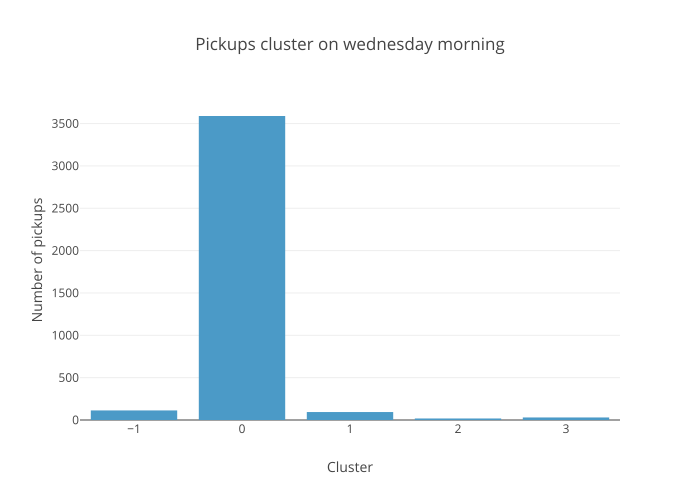

In [136]:
cluster_morning_dbscan = df_wednesday_morning.cluster_manhattan.value_counts()

fig = px.bar(df, 
            x=cluster_morning_dbscan.index,
            y= cluster_morning_dbscan.values,
            labels={'x': 'Cluster', 'y':'number of pickups'},      
            title='Pickups cluster on wednesday morning', 
                   )

fig.update_layout(xaxis_title='Cluster', yaxis_title='Number of pickups', 
                  xaxis=dict(tickmode='linear'))

fig.show()

Pourcentage de chaque cluster

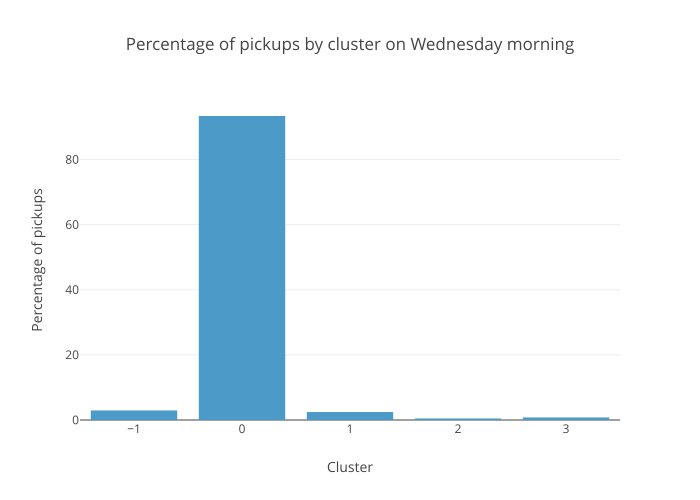

In [137]:
cluster_percentages = (cluster_morning_dbscan / cluster_morning_dbscan.sum()) * 100

# Create a bar chart to visualize the percentage distribution
fig = px.bar(x=cluster_percentages.index,
             y=cluster_percentages.values,
             labels={'x': 'Cluster', 'y': 'Percentage of pickups'},
             title='Percentage of pickups by cluster on Wednesday morning')

# Update layout to add labels and ensure the x-axis is linear
fig.update_layout(xaxis_title='Cluster', yaxis_title='Percentage of pickups', 
                  xaxis=dict(tickmode='linear'))

fig.show()

In [138]:
cluster_percentages

cluster_manhattan
 0    93.366285
-1     2.939646
 1     2.445369
 3     0.780437
 2     0.468262
Name: count, dtype: float64

#### En applicant dbscan aux données du créneau du mercredi à 10h il y a qu'une hot zone, celle du cluster 0, qui concentre la plupart des pickups (le 93%).

### Analyse du créneau de mercredi heure de pointe 17h et 18h

In [141]:
X_rush_hour = df_rush_hour_wednesday.drop(['Day','Hour'], axis = 1)

In [142]:
sc = StandardScaler()

print("Performing preprocessing...")
print(X_rush_hour.head())
print()
X_rush_hour = sc.fit_transform(X_rush_hour)
print('...Done.')
print(X_rush_hour[0:5]) 
print()

Performing preprocessing...
          Lat      Lon
1836  40.7625 -73.9810
1837  40.7574 -73.9862
1838  40.7605 -73.9821
1839  40.7518 -73.9758
1840  40.7174 -74.0027

...Done.
[[ 0.63027723 -0.01057943]
 [ 0.46288188 -0.13575544]
 [ 0.56463199 -0.03705897]
 [ 0.27907522  0.11459659]
 [-0.85002282 -0.53294857]]



In [143]:
db_manhattan_rush = DBSCAN(eps=0.8, min_samples=30, metric="manhattan", algorithm="auto")

# Fit on data
## No need to normalize data, it already is!
db_manhattan_rush.fit(X_rush_hour)

# Visualize with plotly

## Import go to build our own figure
import plotly.graph_objects as go

fig = go.Figure()

# Loop through each label for our cluster
for i in np.unique(db_manhattan_rush.labels_):
    label = X_rush_hour[db_manhattan_rush.labels_ == i]
    fig.add_trace(go.Scatter(x=label[:, 0], y=label[:, 1], mode="markers", name="Cluster {}".format(i)))

fig.show()

In [144]:
df_rush_hour_wednesday.loc[:,"cluster_manhattan"] = db_manhattan_rush.labels_

/var/folders/sp/y1prs_xd6c5dq9mttys340t40000gn/T/ipykernel_21805/3502957024.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



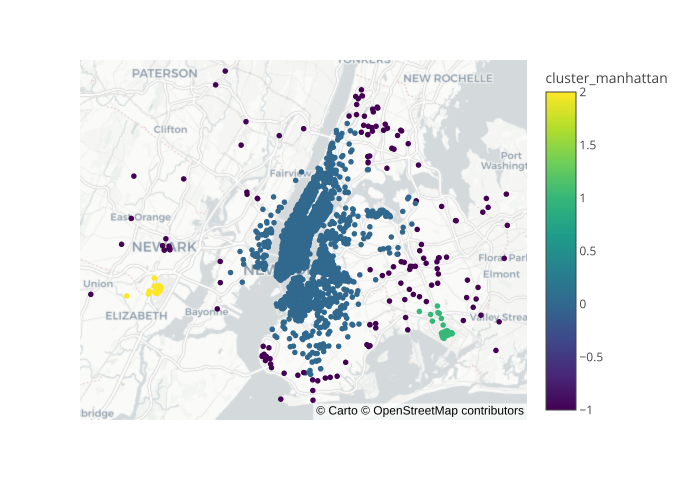

In [145]:
fig = px.scatter_mapbox(df_rush_hour_wednesday, lat="Lat", lon="Lon", color="cluster_manhattan",
                        zoom=9, mapbox_style="carto-positron", color_discrete_sequence=True)
fig.show()

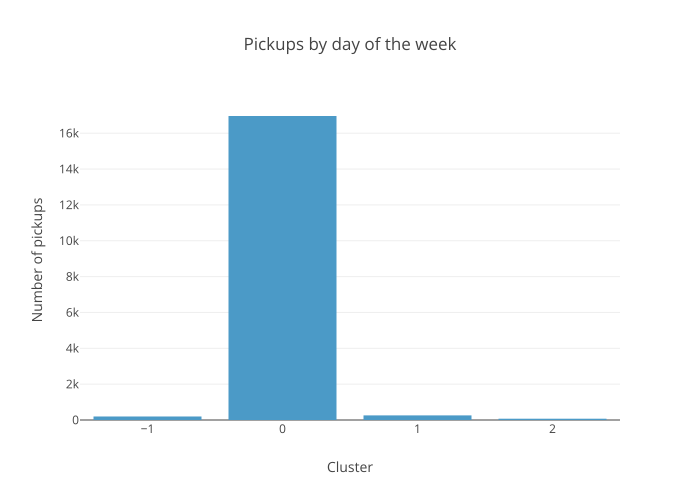

In [146]:
cluster_rush_hour_dbscan = df_rush_hour_wednesday.cluster_manhattan.value_counts()

fig = px.bar(df, 
            x=cluster_rush_hour_dbscan.index,
            y= cluster_rush_hour_dbscan.values,
            labels={'x': 'Cluster', 'y':'number of pickups'},      
            title='Pickups by day of the week', 
                   )

fig.update_layout(xaxis_title='Cluster', yaxis_title='Number of pickups', 
                  xaxis=dict(tickmode='linear'))

fig.show()

### Conclusions DBSCAN

### Pour le créneau du mercredi 17h-19h DBSCAN identifie aussi une seule grande hot-zone et cluster(0) qui correspond en partie à la même zone géographique identifiée comme hot zone à 10 heures. 

### Pourtant, la zone géographique identifiée comme cluster unique est trop grande, ce qui est peut-être lié au fait que DBSCAN se base sur la densité entre les points.

# K-Means

On teste k-means sur notre dataset.

On commence par le créneau de mercredi matin à 10h.


In [ ]:
df_wednesday_morning

In [148]:
X = df_wednesday_morning.drop(['Day','cluster_manhattan','Hour'], axis = 1)


sc = StandardScaler()

print("Performing preprocessing...")
print(X.head())
print()
X = sc.fit_transform(X)
print('...Done.')
print(X[0:5]) 
print()

Performing preprocessing...
          Lat      Lon
1325  40.7595 -73.9854
1326  40.7258 -73.9949
1327  40.7539 -73.9954
1328  40.7720 -73.9610
1329  40.7749 -73.9652

...Done.
[[ 0.4616471  -0.14716646]
 [-0.52676131 -0.33280014]
 [ 0.29740119 -0.34257034]
 [ 0.82826742  0.32961899]
 [ 0.91332334  0.24754936]]



In [149]:
wcss_morning =  []
k_morning = []
for i in range (2,11):
    kmeans = KMeans(n_clusters= i, random_state = 0, n_init = 'auto')
    kmeans.fit(X)
    wcss_morning.append(kmeans.inertia_)
    k_morning.append(i)
    print("WCSS for K={} --> {}".format(i, wcss_morning[-1]))

WCSS for K=2 --> 6245.782427590446
WCSS for K=3 --> 4224.021519544494
WCSS for K=4 --> 3467.11630405443
WCSS for K=5 --> 2945.481980470514
WCSS for K=6 --> 2348.301794668316
WCSS for K=7 --> 2104.547486250919
WCSS for K=8 --> 1863.154649130071
WCSS for K=9 --> 1442.1141080682087
WCSS for K=10 --> 1190.7934415558361


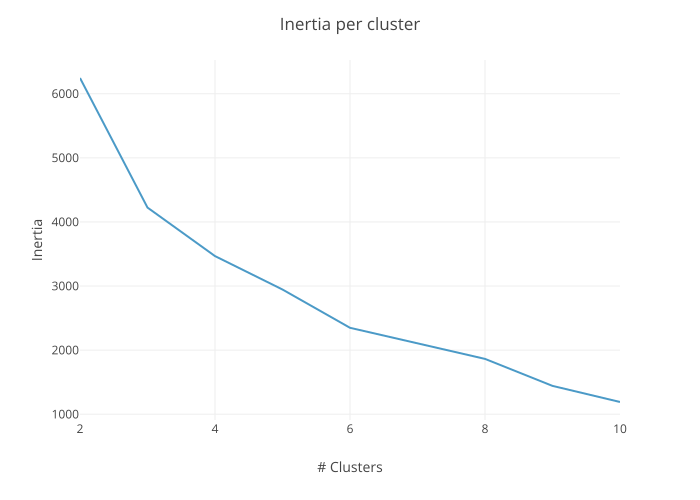

In [150]:
wcss_frame = pd.Series(wcss_morning)
k_frame = pd.Series(k_morning)

# Create figure
fig= px.line(
    wcss_frame,
    x=k_frame,
    y=wcss_frame
)

# Create title and axis labels
fig.update_layout(
    yaxis_title="Inertia",
    xaxis_title="# Clusters",
    title="Inertia per cluster"
)

# Render
#fig.show(renderer="notebook")
fig.show() # if using workspace

In [151]:
# Computer mean silhouette score
sil_morning = []
k_morning = []

## Careful, you need to start at i=2 as silhouette score cannot accept less than 2 labels
for i in range (2,11):
    kmeans = KMeans(n_clusters= i, random_state = 0, n_init = 'auto')
    kmeans.fit(X)
    sil_morning.append(silhouette_score(X, kmeans.predict(X)))
    k_morning.append(i)
    print("Silhouette score for K={} is {}".format(i, sil_morning[-1]))

Silhouette score for K=2 is 0.773627081876413
Silhouette score for K=3 is 0.44790375197353244
Silhouette score for K=4 is 0.45625418630048825
Silhouette score for K=5 is 0.43033089787338835
Silhouette score for K=6 is 0.48012283646653914
Silhouette score for K=7 is 0.41825771643278736
Silhouette score for K=8 is 0.4537075312552732
Silhouette score for K=9 is 0.4915952075019584
Silhouette score for K=10 is 0.43709226077429697


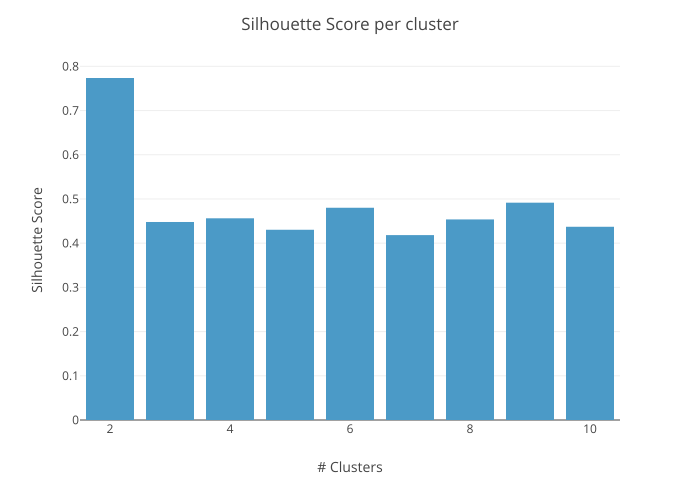

In [152]:
cluster_scores=pd.Series(sil_morning)
k_frame = pd.Series(k_morning)

# Create figure
fig = px.bar(data_frame=cluster_scores,
             x=k_morning,
             y=cluster_scores
)


# Add title and axis labels
fig.update_layout(
    yaxis_title="Silhouette Score",
    xaxis_title="# Clusters",
    title="Silhouette Score per cluster"
)

# Render
#fig.show(renderer="notebook")
fig.show() # if using workspace

On choisit le nombre de clusters en fonction de l'inertie par cluster et le score de silhouettte 

In [153]:
kmeans_morning = KMeans(n_clusters= 6, random_state=42)
kmeans_morning.fit(X)

/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



KMeans(n_clusters=6, random_state=42)

In [154]:
df_wednesday_morning['Cluster_KMeans'] = kmeans_morning.predict(X)
df_wednesday_morning.head()

/var/folders/sp/y1prs_xd6c5dq9mttys340t40000gn/T/ipykernel_21805/2056656268.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Lat,Lon,Day,Hour,cluster_manhattan,Cluster_KMeans
1325,40.7595,-73.9854,Wednesday,10,0,2
1326,40.7258,-73.9949,Wednesday,10,0,1
1327,40.7539,-73.9954,Wednesday,10,0,2
1328,40.7720,-73.9610,Wednesday,10,0,2
1329,40.7749,-73.9652,Wednesday,10,0,2


#### Visualisation créneau de mercredi à 10h.

#### Représentation géographique des clusters identifiés par K-Means

On obtient 6 clusters 

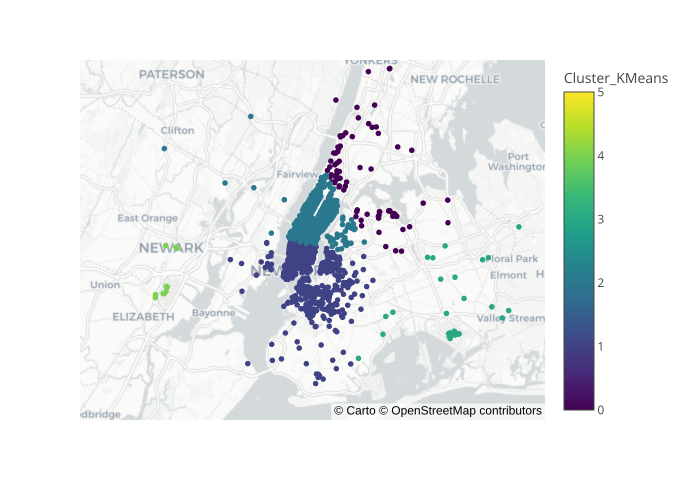

In [155]:
fig = px.scatter_mapbox(df_wednesday_morning, lat="Lat", lon="Lon", color="Cluster_KMeans",
                        zoom=9, mapbox_style="carto-positron")
fig.show()

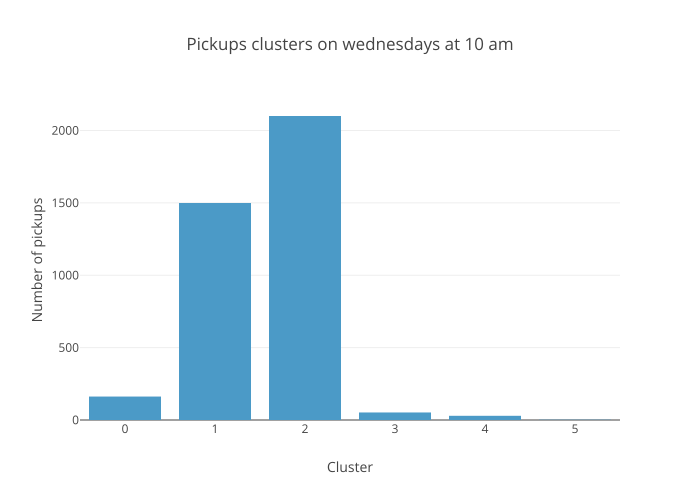

In [156]:
cluster_morning_kmeans = df_wednesday_morning.Cluster_KMeans.value_counts()

fig = px.bar(df, 
            x=cluster_morning_kmeans.index,
            y= cluster_morning_kmeans.values,
            labels={'x': 'Cluster', 'y':'number of pickups'},      
            title='Pickups clusters on wednesdays at 10 am', 
                   )
fig.update_layout(xaxis_title='Cluster', yaxis_title='Number of pickups', 
                  xaxis=dict(tickmode='linear'))
fig.show()

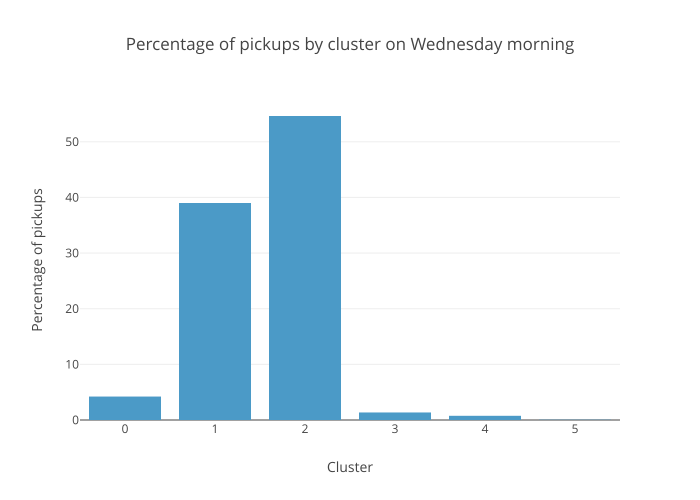

In [157]:
cluster_percentages_kmeans = (cluster_morning_kmeans / df_wednesday_morning.shape[0]) * 100

# Create a bar chart to visualize the percentage distribution
fig = px.bar(x=cluster_morning_kmeans.index,
             y=cluster_percentages_kmeans,
             labels={'x': 'Cluster', 'y': 'Percentage of pickups'},
             title='Percentage of pickups by cluster on Wednesday morning')

# Update layout to add labels and ensure the x-axis is linear
fig.update_layout(xaxis_title='Cluster', yaxis_title='Percentage of pickups', 
                  xaxis=dict(tickmode='linear'))

fig.show()

In [158]:
cluster_percentages_kmeans

Cluster_KMeans
2    54.630593
1    38.995838
0     4.214360
3     1.352758
4     0.754422
5     0.052029
Name: count, dtype: float64

### Conclusions K-means créneau mercredi matin 

### Si on utilise K-means le mercredi matin les hot-zones à privilégier sont les zone des cluster 1 et 2 qui constituent le 39% et le 57% de pick-ups.
### K-means réussit à nous donner des informations plus précises que DBSCAN pour ce dataset.


## K-means sur les créneaux de mercredi à 17 et à 18h.

In [160]:
X_rush_hour = df_rush_hour_wednesday.drop(['Day', 'Hour', 'cluster_manhattan'], axis = 1)

sc = StandardScaler()

print("Performing preprocessing...")
print(X_rush_hour.head())
print()
X_rush_hour = sc.fit_transform(X_rush_hour)
print('...Done.')
print(X_rush_hour[0:5]) 
print()

Performing preprocessing...
          Lat      Lon
1836  40.7625 -73.9810
1837  40.7574 -73.9862
1838  40.7605 -73.9821
1839  40.7518 -73.9758
1840  40.7174 -74.0027

...Done.
[[ 0.63027723 -0.01057943]
 [ 0.46288188 -0.13575544]
 [ 0.56463199 -0.03705897]
 [ 0.27907522  0.11459659]
 [-0.85002282 -0.53294857]]



In [161]:
wcss_rush =  []
k_rush = []
for i in range (2,11):
    kmeans = KMeans(n_clusters= i, random_state = 0, n_init = 'auto')
    kmeans.fit(X_rush_hour)
    wcss_rush.append(kmeans.inertia_)
    k_rush.append(i)
    print("WCSS for K={} --> {}".format(i, wcss_rush[-1]))

WCSS for K=2 --> 24803.555075730208
WCSS for K=3 --> 16447.898122008773
WCSS for K=4 --> 12691.588004088791
WCSS for K=5 --> 10929.116550247429
WCSS for K=6 --> 8694.723678748142
WCSS for K=7 --> 7456.989591021305
WCSS for K=8 --> 5257.0056877560155
WCSS for K=9 --> 4862.940225033302
WCSS for K=10 --> 4192.860718266598


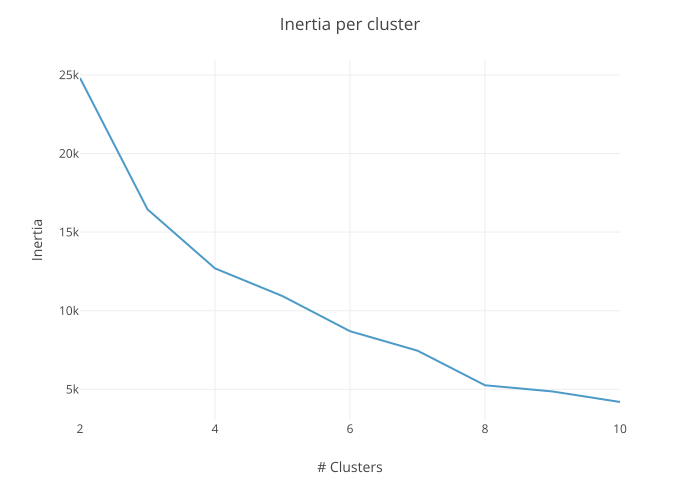

In [162]:
wcss_frame = pd.Series(wcss_rush)
k_frame = pd.Series(k_rush)

# Create figure
fig= px.line(
    wcss_frame,
    x=k_frame,
    y=wcss_frame#.iloc[:,-1]
)

# Create title and axis labels
fig.update_layout(
    yaxis_title="Inertia",
    xaxis_title="# Clusters",
    title="Inertia per cluster"
)

# Render
#fig.show(renderer="notebook")
fig.show() # if using workspace

In [163]:
# Computer mean silhouette score
sil_rush = []
k_rush = []

## Careful, you need to start at i=2 as silhouette score cannot accept less than 2 labels
for i in range (2,11):
    kmeans = KMeans(n_clusters= i, random_state = 0, n_init = 'auto')
    kmeans.fit(X_rush_hour)
    sil_rush.append(silhouette_score(X_rush_hour, kmeans.predict(X_rush_hour)))
    k_rush.append(i)
    print("Silhouette score for K={} is {}".format(i, sil_rush[-1]))

Silhouette score for K=2 is 0.7966231112572798
Silhouette score for K=3 is 0.46739832300670003
Silhouette score for K=4 is 0.508211797251652
Silhouette score for K=5 is 0.48955352549833103
Silhouette score for K=6 is 0.4936823718413874
Silhouette score for K=7 is 0.40455604801703354
Silhouette score for K=8 is 0.4143659468649396
Silhouette score for K=9 is 0.4176529377908333
Silhouette score for K=10 is 0.4320655689869999


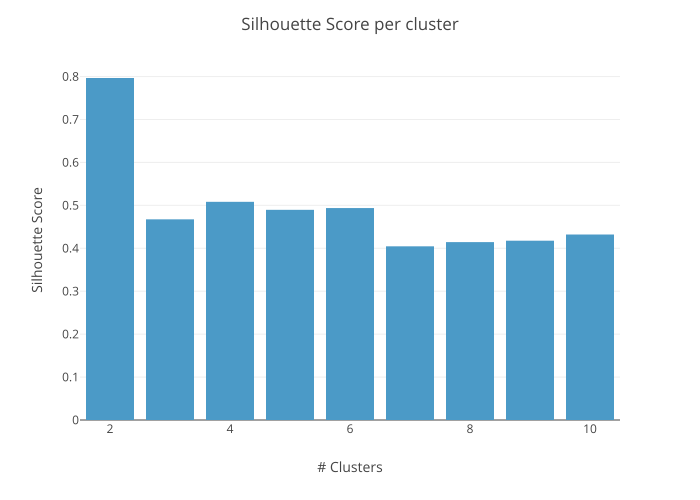

In [164]:

cluster_scores=pd.Series(sil_rush)
k_frame = pd.Series(k_rush)

# Create figure
fig = px.bar(data_frame=cluster_scores,
             x=k_frame,
             y=cluster_scores
            )

# Add title and axis labels
fig.update_layout(
    yaxis_title="Silhouette Score",
    xaxis_title="# Clusters",
    title="Silhouette Score per cluster"
)

# Render
#fig.show(renderer="notebook")
fig.show() # if using workspace

In [165]:
kmeans_rush = KMeans(n_clusters= 6, random_state=42)
kmeans_rush.fit(X_rush_hour)

/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



KMeans(n_clusters=6, random_state=42)

In [166]:
df_rush_hour_wednesday['Cluster_KMeans'] = kmeans_rush.predict(X_rush_hour)
df_rush_hour_wednesday.head()

/var/folders/sp/y1prs_xd6c5dq9mttys340t40000gn/T/ipykernel_21805/81097646.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Lat,Lon,Day,Hour,cluster_manhattan,Cluster_KMeans
1836,40.7625,-73.9810,Wednesday,17,0,4
1837,40.7574,-73.9862,Wednesday,17,0,4
1838,40.7605,-73.9821,Wednesday,17,0,4
1839,40.7518,-73.9758,Wednesday,17,0,4
1840,40.7174,-74.0027,Wednesday,17,0,0


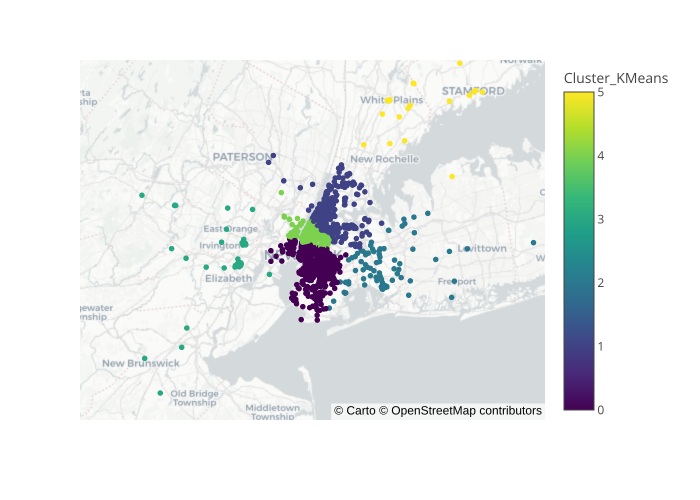

In [167]:
fig = px.scatter_mapbox(df_rush_hour_wednesday, lat="Lat", lon="Lon", color="Cluster_KMeans",
                        zoom=8, mapbox_style="carto-positron")
fig.show()

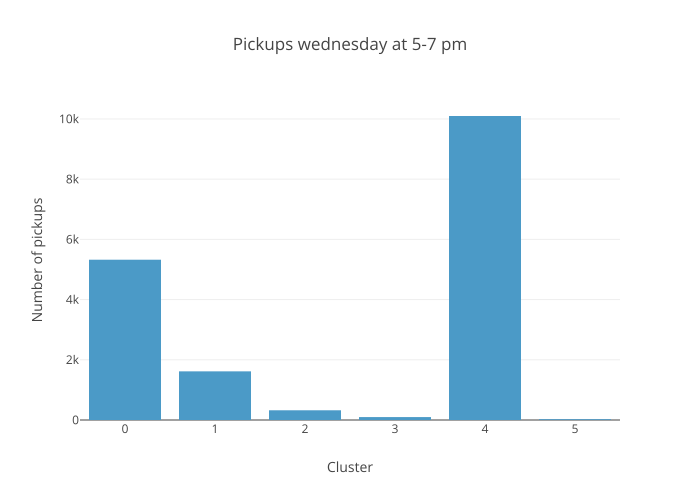

In [168]:
cluster_rush_hour_kmeans = df_rush_hour_wednesday.Cluster_KMeans.value_counts()

fig = px.bar(df, 
            x=cluster_rush_hour_kmeans.index,
            y= cluster_rush_hour_kmeans.values,
            labels={'x': 'Cluster', 'y':'number of pickups'},      
            title='Pickups wednesday at 5-7 pm', 
                   )
fig.update_layout(xaxis_title='Cluster', yaxis_title='Number of pickups', 
                  xaxis=dict(tickmode='linear'))

fig.show()

In [169]:
cluster_rush_hour_kmeans

Cluster_KMeans
4    10098
0     5324
1     1616
2      323
3       97
5       27
Name: count, dtype: int64

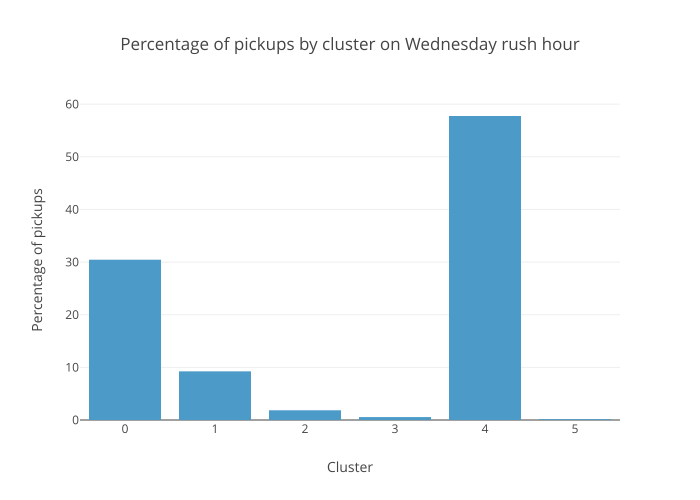

In [170]:


cluster_percentages_kmeans_rush = (cluster_rush_hour_kmeans / cluster_rush_hour_kmeans.sum()) * 100

# Create a bar chart to visualize the percentage distribution
fig = px.bar(x=cluster_percentages_kmeans_rush.index,
             y=cluster_percentages_kmeans_rush.values,
             labels={'x': 'Cluster', 'y': 'Percentage of pickups'},
             title='Percentage of pickups by cluster on Wednesday rush hour')

# Update layout to add labels and ensure the x-axis is linear
fig.update_layout(xaxis_title='Cluster', yaxis_title='Percentage of pickups', 
                  xaxis=dict(tickmode='linear'))

fig.show()

## Conclusions K-means créneau heure de pointe : 

### - comme nous pouvons le voir sur la carte et le bar chart, la zone du cluster 4 est la hot-zone pendant les heures de pointe de 17h à 19h (plus de 50% des pickups). En deuxième position, le cluster 0 représente 30 % des pickups.


### - comme pour le créneau de mercredi à 10h K-means réussit à nous donner des informations plus précises que DBSCAN pour ce dataset.